In [1]:
import sys
from pathlib import Path
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

cr.__version__

'1.5.0'

In [2]:
save_dir = Path("saved/hindbrain")
adata = scv.read(save_dir / "Hindbrain_GABA_Glio[DeepVelo].h5ad", cache=True)
adata

AnnData object with n_obs × n_vars = 13501 × 2000
    obs: 'TotalUMIs', 'barcode', 'Celltype', 'Lineage', 'Timepoint', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'latent_time'
    var: 'Accession', 'AccessionVersion', 'Aliases', 'CcdsID', 'Chromosome', 'ChromosomeEnd', 'ChromosomeStart', 'CosmicID', 'DnaBindingDomain', 'FullName', 'GeneType', 'HgncID', 'IsTFi (TcoF-DB)', 'Location', 'LocationSortable', 'LocusGroup', 'LocusType', 'MgdID', 'MirBaseID', 'OmimID', 'PubmedID', 'RefseqID', 'Regulates (TRRUST)', 'RgdID', 'Strand', 'UcscID', 'UniprotID', 'VegaID', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_r2', 'velocity_genes'
    uns: 'Celltype_colors', 'Celltype_sizes', 'neighbors', 'paga', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_pca', 'X_tsne', 'velocity_tsne'
    varm: 'PCs

In [3]:
from cellrank.tl.estimators import GPCCA, CFLARE

cr.tl.terminal_states(
    adata,
    estimator=CFLARE,
    cluster_key="Celltype",
)  # weight_connectivities=0.2)


Accessing `adata.obsp['T_fwd']`


/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  
/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/13501 [00:00<?, ?cell/s]

Setting `softmax_scale=6.5836`


  0%|          | 0/13501 [00:00<?, ?cell/s]

    Finish (0:00:49)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_fwd']`
       `.eigendecomposition`
    Finish (0:00:01)
Computing terminal states
Adding `adata.obs['terminal_states']`
       `adata.obs['terminal_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
    Finish (0:00:00)


saving figure to file /h/haotian/Code/DeepVelo/figures/cellrank/MDT_terminal_states.png


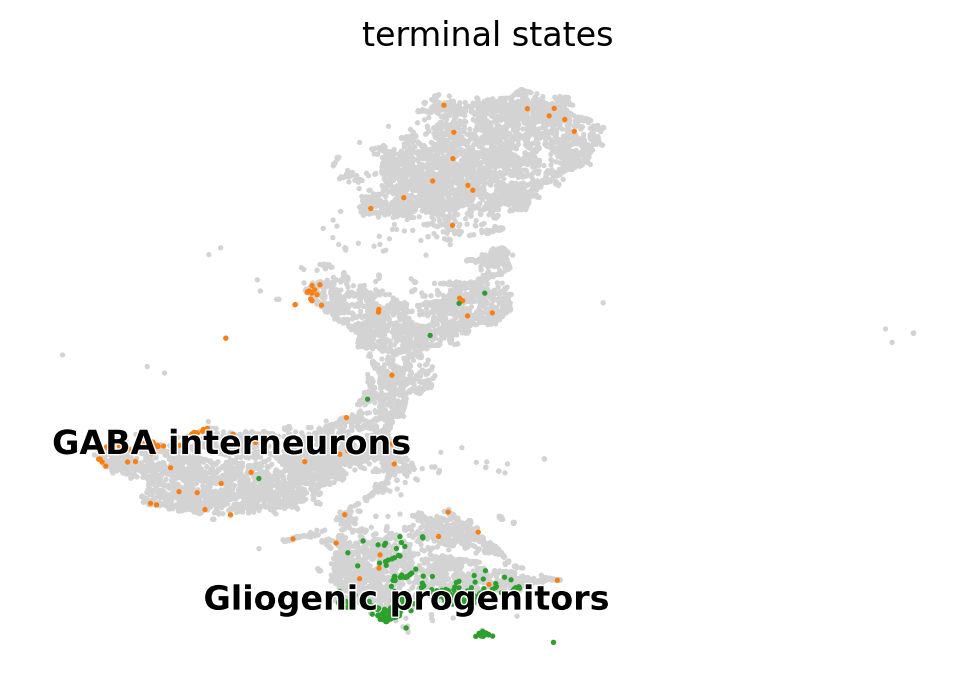

In [4]:
cr.pl.terminal_states(adata, save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_terminal_states.png")

Accessing `adata.obsp['T_bwd']`


/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.
/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


Computing transition matrix based on logits using `'deterministic'` mode
Estimating `softmax_scale` using `'deterministic'` mode


  0%|          | 0/13501 [00:00<?, ?cell/s]

Setting `softmax_scale=6.5836`


  0%|          | 0/13501 [00:00<?, ?cell/s]

    Finish (0:00:50)
Using a connectivity kernel with weight `0.2`
Computing transition matrix based on `adata.obsp['connectivities']`
    Finish (0:00:00)
Computing eigendecomposition of the transition matrix
Adding `adata.uns['eigendecomposition_bwd']`
       `.eigendecomposition`
    Finish (0:00:01)
For 1 macrostate, stationary distribution is computed
Adding `.macrostates`
       `.macrostates_memberships`
       `.coarse_T`
       `.coarse_initial_distribution
       `.coarse_stationary_distribution`
       `.schur_vectors`
       `.schur_matrix`
       `.eigendecomposition`
    Finish (0:00:00)
Adding `adata.obs['initial_states']`
       `adata.obs['initial_states_probs']`
       `.terminal_states`
       `.terminal_states_probabilities`
       `.terminal_states_memberships
    Finish`
saving figure to file /h/haotian/Code/DeepVelo/figures/cellrank/MDT_initial_states.png


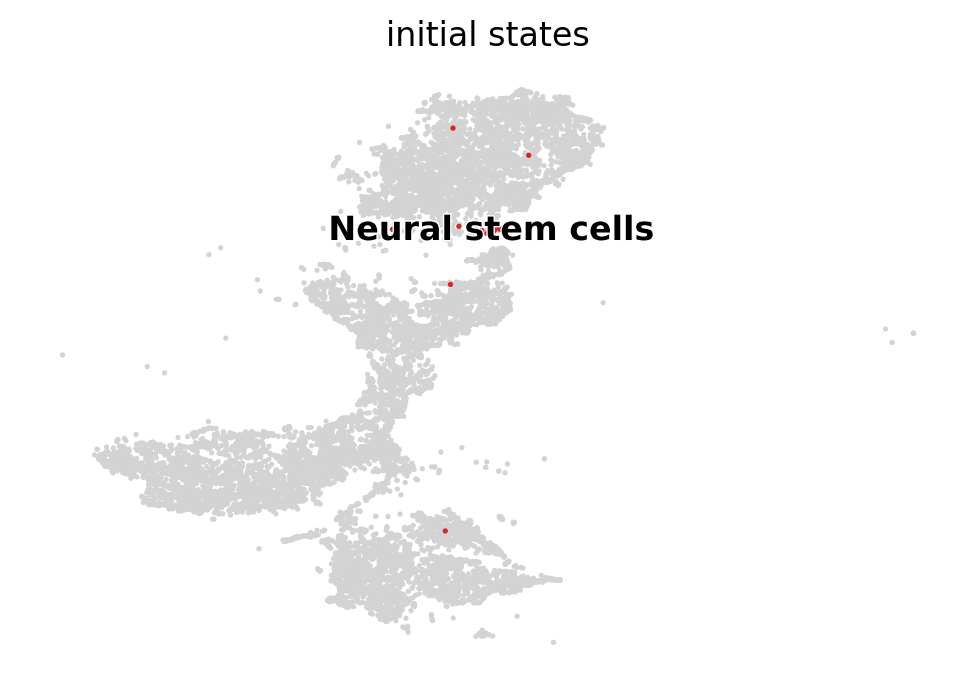

In [5]:
cr.tl.initial_states(adata, cluster_key="Celltype")
cr.pl.initial_states(adata, discrete=True, save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_initial_states.png")

Computing absorption probabilities


/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


  0%|          | 0/2 [00:00<?, ?/s]

Adding `adata.obsm['to_terminal_states']`
       `.absorption_probabilities`
    Finish (0:00:01)
saving figure to file /h/haotian/Code/DeepVelo/figures/cellrank/MDT_lineages.png


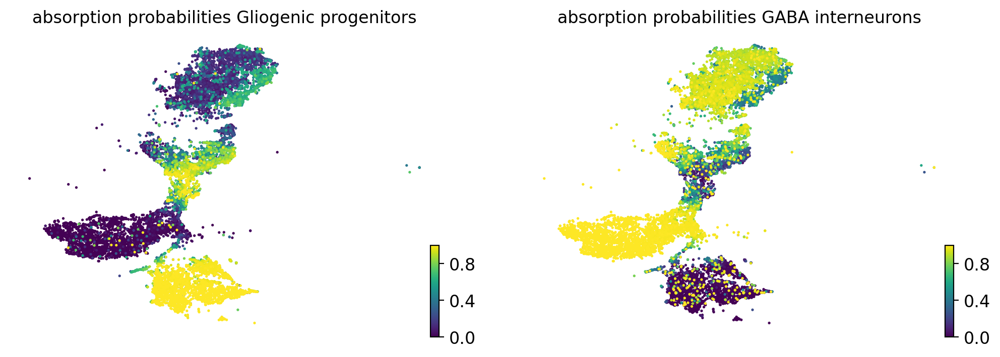

In [6]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False, save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_lineages.png")

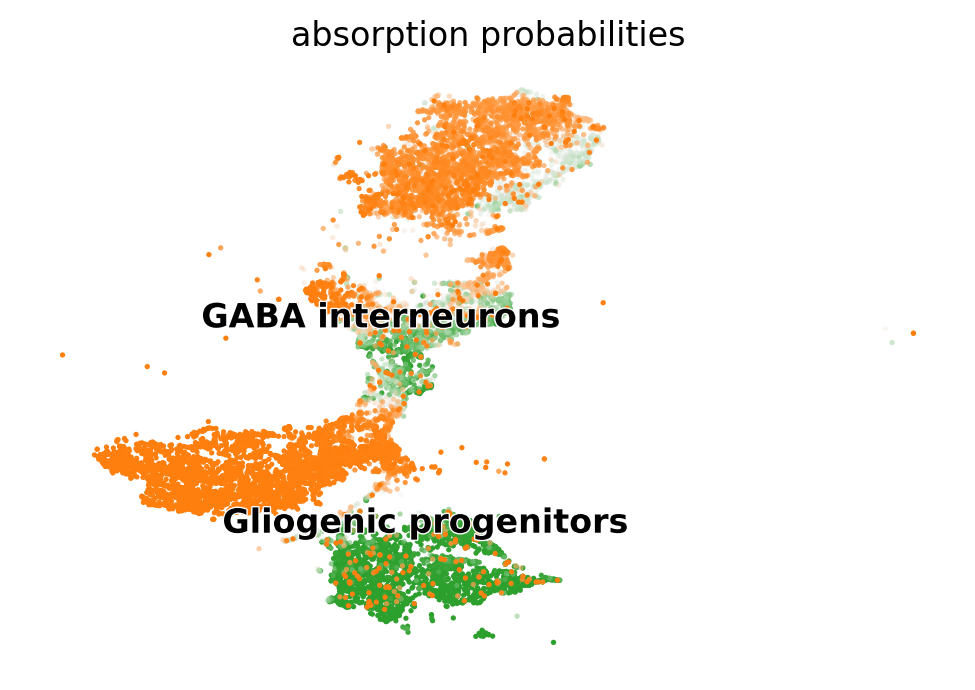

In [7]:
cr.pl.lineages(adata, same_plot=True)

# Compute lineage drivers

In [8]:
driver_genes_df = cr.tl.lineage_drivers(adata)
driver_genes_df.head()

/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


Adding `adata.varm['terminal_lineage_drivers']`
       `.lineage_drivers`
    Finish (0:00:00)


,Gliogenic progenitors_corr,Gliogenic progenitors_pval,Gliogenic progenitors_qval,Gliogenic progenitors_ci_low,Gliogenic progenitors_ci_high,GABA interneurons_corr,GABA interneurons_pval,GABA interneurons_qval,GABA interneurons_ci_low,GABA interneurons_ci_high
Dbi,0.745730,0.0,0.0,0.738147,0.753124,-0.745729,0.0,0.0,-0.753124,-0.738146
Slc1a3,0.700711,0.0,0.0,0.692023,0.709197,-0.700711,0.0,0.0,-0.709197,-0.692022
Acot1,0.658183,0.0,0.0,0.648514,0.667638,-0.658182,0.0,0.0,-0.667638,-0.648514
Ptn,0.648278,0.0,0.0,0.638390,0.657951,-0.648277,0.0,0.0,-0.657950,-0.638390
Ednrb,0.646128,0.0,0.0,0.636194,0.655848,-0.646128,0.0,0.0,-0.655848,-0.636194


In [9]:
# save df to csv
driver_genes_df.to_csv(save_dir/"MDT_lineage_drivers[DeepVelo][CFLARE].csv")
driver_genes_df.to_csv("/h/haotian/Code/DeepVelo/examples/r_analysis/data/MDT_driver_genes.csv")

/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:724: MatplotlibDeprecationWarning: Passing *transOffset* without *offsets* has no effect. This behavior is deprecated since 3.5 and in 3.6, *transOffset* will begin having an effect regardless of *offsets*. In the meantime, if you wish to set *transOffset*, call collection.set_offset_transform(transOffset) explicitly.
  alpha=alpha,


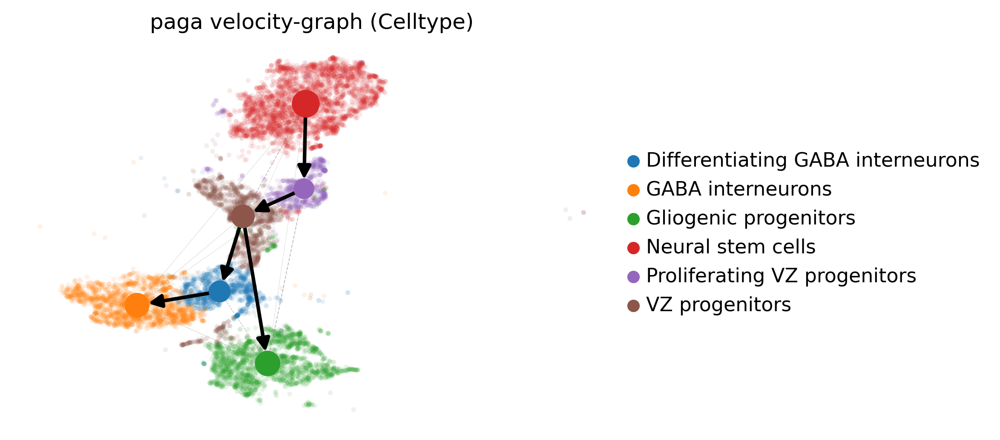

In [10]:
scv.pl.paga(
    adata,
    basis="tsne",
    size=30,
    alpha=0.1,
    min_edge_width=2,
    node_size_scale=1,
    dpi=150,
)

In [11]:
# the list of drivers from MDT paper: ground truth genes
GT_genes = ['Eomes',
 'Pax2',
 'Rora',
 'Aldh1l1',
 'Cxcl12',
 'Rgs5',
 'Lhx2',
 'Lhx9',
 'Pdgfra',
 'Olig3',
 'Lmx1a']
GABA_drivers_list = driver_genes_df.sort_values(by=['GABA interneurons_corr'], ascending=False).index.tolist()
for g in GT_genes:
     print(GABA_drivers_list.index(g))

753
49
316
1979
707
1158
832
895
1025
736
1161


In [12]:
Glio_drivers_list = driver_genes_df.sort_values(by=['Gliogenic progenitors_corr'], ascending=False).index.tolist()
for g in GT_genes:
     print(Glio_drivers_list.index(g))

1246
1950
1683
20
1292
841
1167
1104
974
1263
838


In [13]:
# the max, mean, std of Gliogenic progenitors_corr
glio_corr = driver_genes_df["Gliogenic progenitors_corr"]
print(
    f"Gliogenic progenitors_corr max: {glio_corr.max():.4f}, "
    f"mean: {glio_corr.mean():.4f}, std: {glio_corr.std():.4f}"
)
print(
    f"Positive Gliogenic progenitors_corr mean: {glio_corr[glio_corr>0].mean():.4f}, "
    f"std: {glio_corr[glio_corr>0].std():.4f}"
)


Gliogenic progenitors_corr max: 0.7457, mean: -0.0034, std: 0.1448
Positive Gliogenic progenitors_corr mean: 0.1147, std: 0.1364


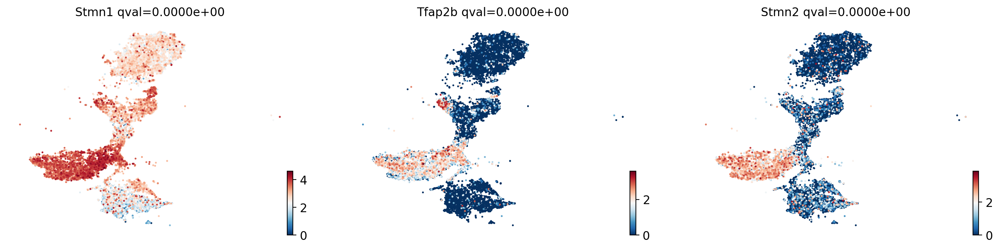

In [18]:
cr.pl.lineage_drivers(adata, lineage="GABA interneurons", n_genes=3, save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_GABA_lineage_drivers.png")

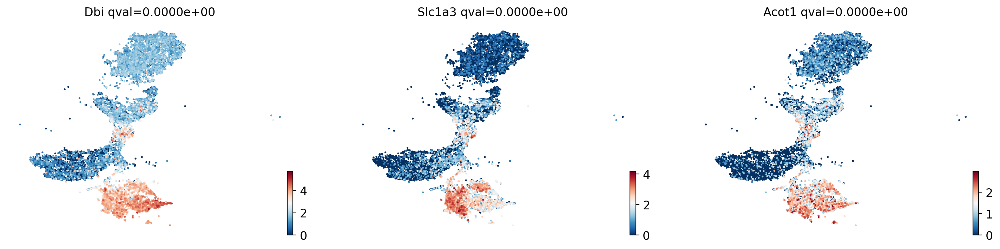

In [19]:
cr.pl.lineage_drivers(adata, lineage="Gliogenic progenitors", n_genes=3, save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_Glio_lineage_drivers.png")

# Gene expression trends

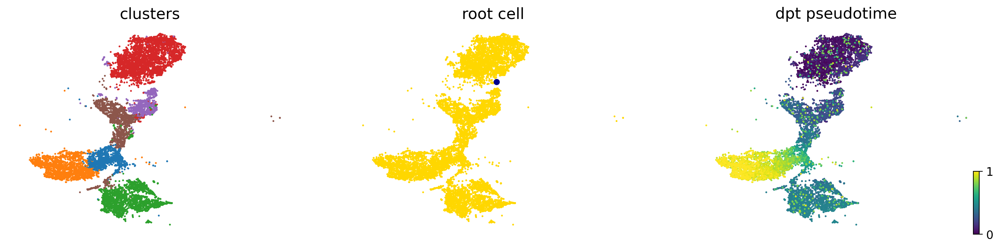

In [20]:
# compue DPT, starting from CellRank defined root cell
root_idx = np.where(adata.obs["initial_states"] == "Neural stem cells")[0][0]
adata.uns["iroot"] = root_idx
sc.tl.dpt(adata)

scv.pl.scatter(
    adata,
    color=["Celltype", root_idx, "dpt_pseudotime"],
    fontsize=16,
    cmap="viridis",
    perc=[2, 98],
    colorbar=True,
    rescale_color=[0, 1],
    title=["clusters", "root cell", "dpt pseudotime"],
)

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` o

    Finish (0:00:01)
Plotting trends


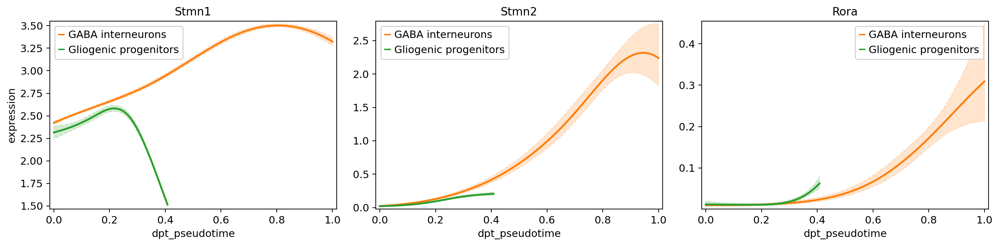

In [21]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Stmn1", "Stmn2", "Rora"],
    ncols=3,
    time_key="dpt_pseudotime",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
    save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_gene_trends.png",
)

Computing trends using `1` core(s)


  0%|          | 0/3 [00:00<?, ?gene/s]

/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` o

    Finish (0:00:01)
Plotting trends


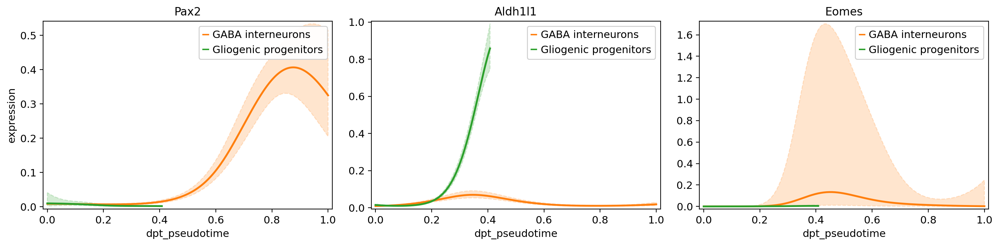

In [22]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Pax2", "Aldh1l1", "Eomes"],
    ncols=3,
    time_key="dpt_pseudotime",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
    save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_gene_trends.png",
)

Computing trends using `8` core(s)


  0%|          | 0/60 [00:00<?, ?gene/s]

did not converge
did not converge
did not converge
    Finish (0:00:39)


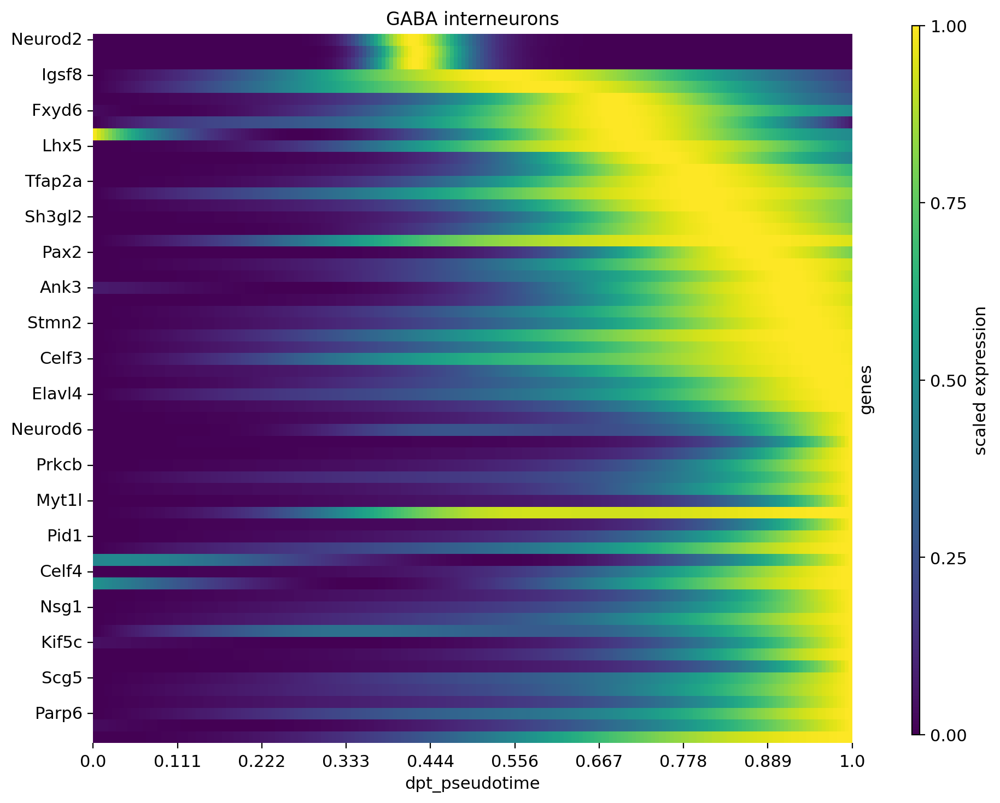

In [26]:
cr.pl.heatmap(
    adata,
    model,
    genes=adata.varm['terminal_lineage_drivers']["GABA interneurons_corr"].sort_values(ascending=False).index[:60],
    show_absorption_probabilities=False,
    lineages="GABA interneurons",
    time_key="dpt_pseudotime",
    n_jobs=8,
    backend="loky",
)

# Verified transcriptional factors

In [27]:
# list of TFs
TFs = ["Sox9", "Tcf12", "Tcf7l2", "Nfix", "Neurod6", 
"Tcf4", "Prdm8" ,"Zfp57"]

Computing trends using `1` core(s)


  0%|          | 0/8 [00:00<?, ?gene/s]

/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/h/haotian/.cache/pypoetry/virtualenvs/deepvelo-k1wFjE0q-py3.7/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` o

    Finish (0:00:03)
Plotting trends


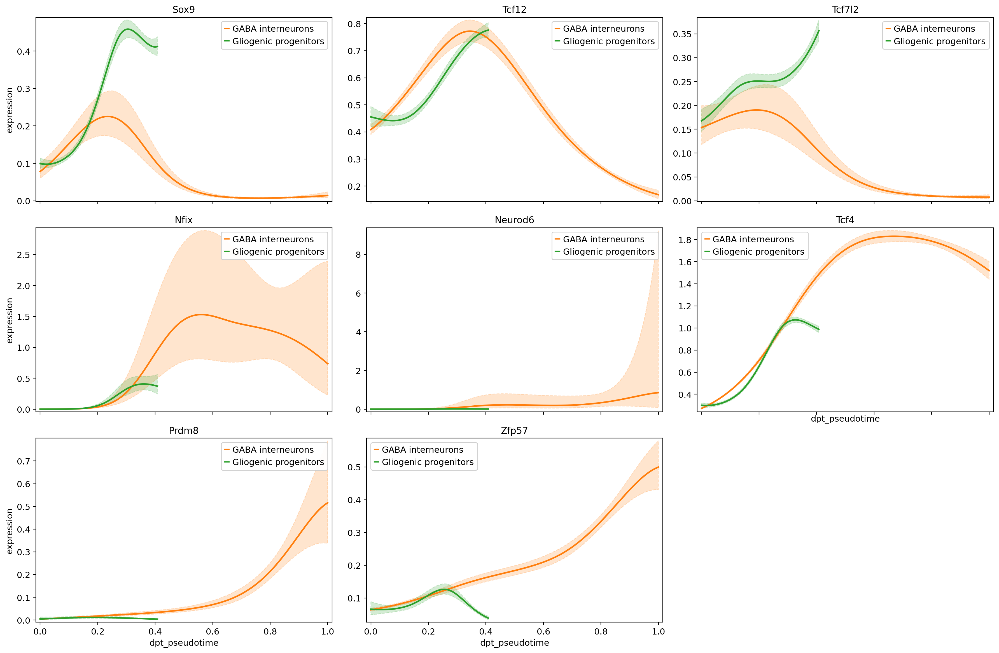

In [28]:
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=TFs,
    ncols=3,
    time_key="dpt_pseudotime",
    same_plot=True,
    hide_cells=True,
    # figsize=(15, 4),
    n_test_points=200,
    save="/h/haotian/Code/DeepVelo/figures/cellrank/MDT_TF_trends.png",
)

saving figure to file /h/haotian/Code/DeepVelo/figures/cellrank/MDT_TF_velocities.png


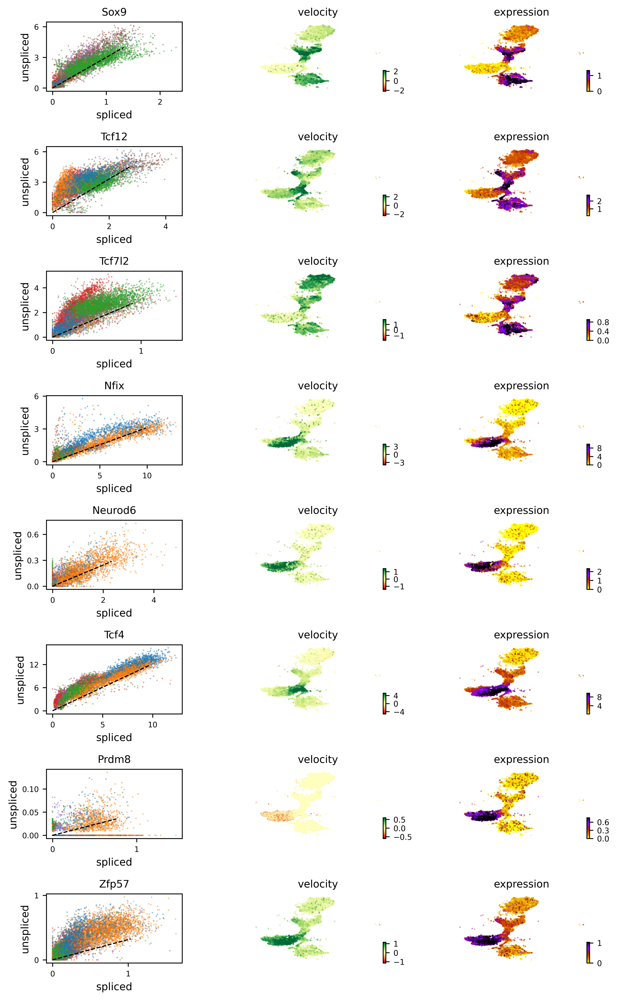

In [29]:
scv.pl.velocity(
    adata,
    var_names=TFs,
    basis='tsne',
    color='Celltype',
    dpi=300,
    save=f"/h/haotian/Code/DeepVelo/figures/cellrank/MDT_TF_velocities.png"
)

# compare computed driver genes with ground truth markers listed in the original paper

## read the ground truth markers

In [ ]:
import pandas as pd
# ground truth markers
gt_markers_file_path = "data/vla_marker_list_cleaned(MDT_ground_truth).tsv" 
gt_markers = pd.read_csv(gt_markers_file_path, sep="\t")

In [ ]:
gt_markers.head()

In [ ]:
glio_lineage = ["Gliogenic progenitors", "VZ progenitors"]
gt_markers_for_glio = gt_markers.loc[gt_markers["Annotations"].isin(glio_lineage)]
print(f"num of glio markers: {len(gt_markers_for_glio)}")

gaba_lineage = ["Proliferating VZ progenitors", "VZ progenitors", "Differentiating GABA interneurons", "GABA interneurons"]
gt_markers_for_gaba = gt_markers.loc[gt_markers["Annotations"].isin(gaba_lineage)]
print(f"num of gaba markers: {len(gt_markers_for_gaba)}")

In [ ]:
gt_markers_for_gaba

## load the predicted markers from DeepVelo

In [ ]:
driver_genes_df = pd.read_csv("data/MDT_driver_genes[DeepVelo].csv", index_col=0)
driver_genes_df.head()

In [ ]:
GABA_drivers_list = driver_genes_df.sort_values(by=['GABA interneurons_corr'], ascending=False).index.tolist()
hits = []
for g in GABA_drivers_list[:100]:
    if g in gt_markers_for_gaba["gene_name"].tolist():
        hits.append(g)
print(f"num of hits in top 100 drivers: {len(hits)}")

In [ ]:
Glio_drivers_list = driver_genes_df.sort_values(by=['Gliogenic progenitors_corr'], ascending=False).index.tolist()
hits = []
for g in Glio_drivers_list[:100]:
    if g in gt_markers_for_glio["gene_name"].tolist():
        hits.append(g)
print(f"num of hits in top 100 drivers: {len(hits)}")

In [ ]:
Glio_drivers_list

## for the compared method

In [ ]:
driver_genes_df = pd.read_csv("data/MDT_driver_genes[DYNAMICAL].csv", index_col=0)
driver_genes_df.head()

In [ ]:
GABA_drivers_list = driver_genes_df.sort_values(by=['GABA interneurons_corr'], ascending=False).index.tolist()
hits = []
for g in GABA_drivers_list[:100]:
    if g in gt_markers_for_gaba["gene_name"].tolist():
        hits.append(g)
print(f"num of hits in top 100 drivers: {len(hits)}")

In [ ]:
Glio_drivers_list = driver_genes_df.sort_values(by=['Gliogenic progenitors_corr'], ascending=False).index.tolist()
hits = []
for g in Glio_drivers_list[:100]:
    if g in gt_markers_for_glio["gene_name"].tolist():
        hits.append(g)
print(f"num of hits in top 100 drivers: {len(hits)}")